# Understanding Gibbs energies in ARCS models

In [1]:
import numpy as np
import pandas as pd
import json
from arcs.traversal import (
    traverse,
    _get_weighted_reaction_rankings,
    _get_weighted_random_compounds,
    _random_walk,
)
from arcs.model import Table, get_reaction_compounds, get_reactions, get_table
from arcs.analysis import AnalyseSampling
from chempy import Equilibrium
import pytest
import math

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

ARCS is using pre-computed tables of reactions and cost functions with Gibbs energy for each of the reactions.
It is pre-computed using Vasp software.
Below is the list of pressures and temperatures for which said reactions are pre-computed:



In [2]:
pressure_list = [1, 2, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 100, 125, 150, 175, 200, 225, 250, 275, 300]
temperature_list = [200, 250, 300, 350, 400]

Let's fetch reactions and table for T=300 and P=10


In [3]:
reactions = get_reactions(300, 100)
table = get_table(300, 10)
print(reactions[0])

{'e': <chempy.chemistry.Equilibrium object at 0x1261cb6e0>, 'k': np.float64(2.853253290985673e-107), 'g': 6.342223154770487}


First of all, let's check that for all pre-computed pressures and temperatures we have the same reactions

In [27]:
prev_reactions = get_reactions(200, 1)
for p in pressure_list:
    for t in temperature_list:
        next_reactions = get_reactions(t, p)
        for reaction_id in range(len(prev_reactions)):
            assert prev_reactions[reaction_id]["e"].prod == next_reactions[reaction_id]["e"].prod, (
                f"Discrepancy found!\n{p=} {t=}\n"
                f"{prev_reactions[reaction_id]["e"].prod=} {next_reactions[reaction_id]["e"].prod=}"
            )
            assert prev_reactions[reaction_id]["e"].reac == next_reactions[reaction_id]["e"].reac, (
                f"Discrepancy found!\n{p=} {t=}\n"
                f"{prev_reactions[reaction_id]["e"].reac=} {next_reactions[reaction_id]["e"].reac=}"
            )
        print(f"All good for {p=} {t=}")
        prev_reactions = next_reactions


Now let's store all Gibbs values in pandas dataframe

In [4]:
results = []

for p in pressure_list:
    for t in temperature_list:
        reactions = get_reactions(t, p)
        for reaction_id in range(len(reactions)):
            g_value = reactions[reaction_id]['g']
            results.append({
                'Reaction_id': reaction_id,
                'Pressure': p,
                'Temperature': t,
                'g': g_value
            })

# Convert results to a DataFrame for better readability
df_results = pd.DataFrame(results)

# Print the DataFrame
print(df_results)


        Reaction_id  Pressure  Temperature          g
0                 0         1          200   6.277071
1                 1         1          200   5.137481
2                 2         1          200  72.049270
3                 3         1          200   1.813957
4                 4         1          200  -1.191956
...             ...       ...          ...        ...
956860         9108       300          400  -0.825939
956861         9109       300          400 -12.392262
956862         9110       300          400  -1.729522
956863         9111       300          400 -23.912843
956864         9112       300          400  -4.698187

[956865 rows x 4 columns]


In [5]:
grouped = df_results.groupby('Reaction_id')

# Iterate through each group and print g as a function of Pressure and Temperature
for reaction_id, group in grouped:
    print(f"Reaction ID: {reaction_id}")
    for index, row in group.iterrows():
        print(f"  Pressure: {row['Pressure']}, Temperature: {row['Temperature']}, g: {row['g']}")
    print()  # Blank line for better readability

Reaction ID: 0
  Pressure: 1.0, Temperature: 200.0, g: 6.277070938601938
  Pressure: 1.0, Temperature: 250.0, g: 6.2506434989364905
  Pressure: 1.0, Temperature: 300.0, g: 6.223170336515203
  Pressure: 1.0, Temperature: 350.0, g: 6.195183277547969
  Pressure: 1.0, Temperature: 400.0, g: 6.167005687628382
  Pressure: 2.0, Temperature: 200.0, g: 6.289017095056323
  Pressure: 2.0, Temperature: 250.0, g: 6.26557619450449
  Pressure: 2.0, Temperature: 300.0, g: 6.241089571196781
  Pressure: 2.0, Temperature: 350.0, g: 6.216089051343154
  Pressure: 2.0, Temperature: 400.0, g: 6.190898000537167
  Pressure: 5.0, Temperature: 200.0, g: 6.304809054899309
  Pressure: 5.0, Temperature: 250.0, g: 6.285316144308219
  Pressure: 5.0, Temperature: 300.0, g: 6.2647775109612525
  Pressure: 5.0, Temperature: 350.0, g: 6.243724981068361
  Pressure: 5.0, Temperature: 400.0, g: 6.222481920223132
  Pressure: 10.0, Temperature: 200.0, g: 6.316755211353701
  Pressure: 10.0, Temperature: 250.0, g: 6.300248839876

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



  Pressure: 50.0, Temperature: 400.0, g: 116.8299957576462
  Pressure: 100.0, Temperature: 200.0, g: 124.83677385840838
  Pressure: 100.0, Temperature: 250.0, g: 123.12546460516728
  Pressure: 100.0, Temperature: 300.0, g: 121.25003938792065
  Pressure: 100.0, Temperature: 350.0, g: 119.22126978199367
  Pressure: 100.0, Temperature: 400.0, g: 117.04502657382545
  Pressure: 125.0, Temperature: 200.0, g: 124.87138608890609
  Pressure: 125.0, Temperature: 250.0, g: 123.16872989328886
  Pressure: 125.0, Temperature: 300.0, g: 121.30195773366631
  Pressure: 125.0, Temperature: 350.0, g: 119.28184118536387
  Pressure: 125.0, Temperature: 400.0, g: 117.11425103481997
  Pressure: 150.0, Temperature: 200.0, g: 124.8996663403907
  Pressure: 150.0, Temperature: 250.0, g: 123.20408020764489
  Pressure: 150.0, Temperature: 300.0, g: 121.34437811089333
  Pressure: 150.0, Temperature: 350.0, g: 119.33133162546278
  Pressure: 150.0, Temperature: 400.0, g: 117.17081153778963
  Pressure: 175.0, Temperat

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



  Pressure: 10.0, Temperature: 300.0, g: -5.648458479921217
  Pressure: 10.0, Temperature: 350.0, g: -5.396307200443005
  Pressure: 10.0, Temperature: 400.0, g: -5.133455034856965
  Pressure: 15.0, Temperature: 200.0, g: -6.146560032045542
  Pressure: 15.0, Temperature: 250.0, g: -5.931514508139401
  Pressure: 15.0, Temperature: 300.0, g: -5.700868881572987
  Pressure: 15.0, Temperature: 350.0, g: -5.457452669036741
  Pressure: 15.0, Temperature: 400.0, g: -5.203335570392653
  Pressure: 20.0, Temperature: 200.0, g: -6.171350546549647
  Pressure: 20.0, Temperature: 250.0, g: -5.962502651269546
  Pressure: 20.0, Temperature: 300.0, g: -5.738054653329172
  Pressure: 20.0, Temperature: 350.0, g: -5.500836069418952
  Pressure: 20.0, Temperature: 400.0, g: -5.252916599400905
  Pressure: 25.0, Temperature: 200.0, g: -6.190579563492605
  Pressure: 25.0, Temperature: 250.0, g: -5.986538922448233
  Pressure: 25.0, Temperature: 300.0, g: -5.76689817874356
  Pressure: 25.0, Temperature: 350.0, g: 

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



  Pressure: 25.0, Temperature: 250.0, g: 0.7090488281264982
  Pressure: 25.0, Temperature: 300.0, g: 0.10599686389616636
  Pressure: 25.0, Temperature: 350.0, g: -0.527856871044122
  Pressure: 25.0, Temperature: 400.0, g: -1.1889213772030018
  Pressure: 30.0, Temperature: 200.0, g: 1.2885333611020826
  Pressure: 30.0, Temperature: 250.0, g: 0.7247600789513626
  Pressure: 30.0, Temperature: 300.0, g: 0.12485036488607193
  Pressure: 30.0, Temperature: 350.0, g: -0.5058611198892891
  Pressure: 30.0, Temperature: 400.0, g: -1.1637833758831277
  Pressure: 35.0, Temperature: 200.0, g: 1.2991602997402936
  Pressure: 35.0, Temperature: 250.0, g: 0.7380437522491547
  Pressure: 35.0, Temperature: 300.0, g: 0.1407907728434168
  Pressure: 35.0, Temperature: 350.0, g: -0.48726397727239146
  Pressure: 35.0, Temperature: 400.0, g: -1.1425294986066774
  Pressure: 40.0, Temperature: 200.0, g: 1.308365772705372
  Pressure: 40.0, Temperature: 250.0, g: 0.7495505934554672
  Pressure: 40.0, Temperature: 30

Now we can strat plotting Gibbs energy values.
First we will evaluate how Gibbs energy is changing with pressure change.


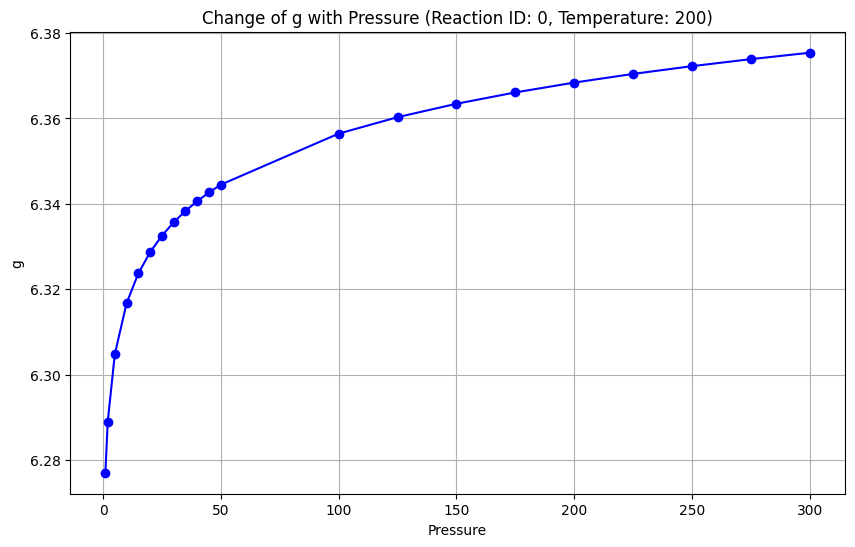

In [6]:
# Filter the DataFrame for Reaction_id = 0 and Temperature = 200
filtered_data = df_results[(df_results['Reaction_id'] == 0) & (df_results['Temperature'] == 200)]

# Plotting g vs Pressure
plt.figure(figsize=(10, 6))
plt.plot(filtered_data['Pressure'], filtered_data['g'], marker='o', linestyle='-', color='b')

# Labels and title
plt.xlabel('Pressure')
plt.ylabel('g')
plt.title('Change of g with Pressure (Reaction ID: 0, Temperature: 200)')
plt.grid()
plt.show()

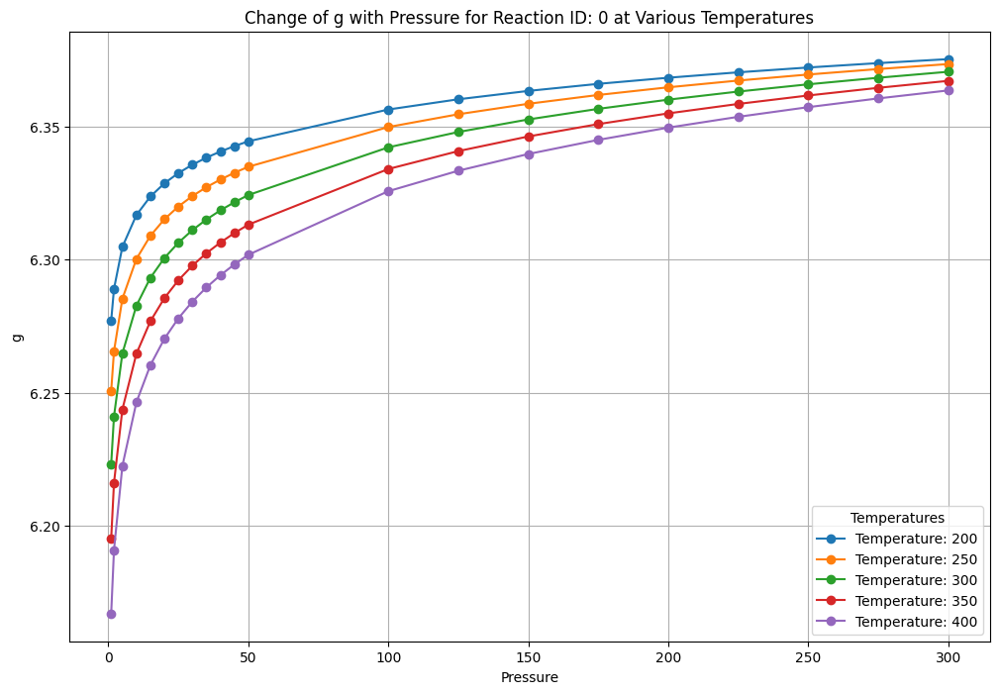

In [7]:
filtered_data = df_results[df_results['Reaction_id'] == 0]

# Create a line plot for each temperature
plt.figure(figsize=(12, 8))

# Plot each temperature
for temp in filtered_data['Temperature'].unique():
    temp_data = filtered_data[filtered_data['Temperature'] == temp]
    plt.plot(temp_data['Pressure'], temp_data['g'], marker='o', linestyle='-', label=f'Temperature: {temp}')

# Labels and title
plt.xlabel('Pressure')
plt.ylabel('g')
plt.title('Change of g with Pressure for Reaction ID: 0 at Various Temperatures')
plt.legend(title='Temperatures')
plt.grid()
plt.show()

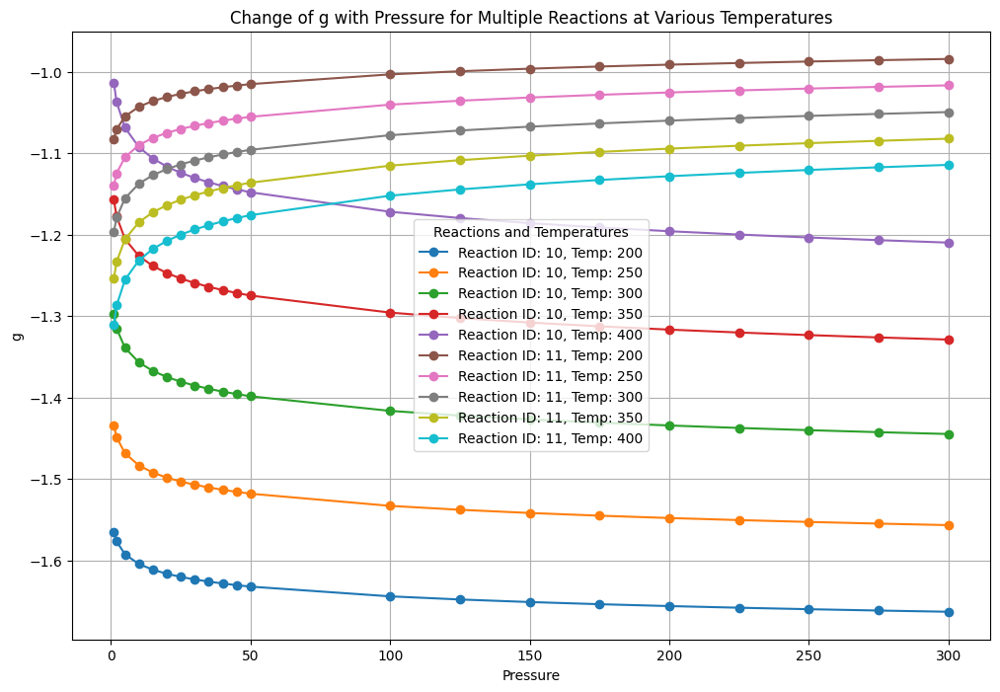

In [10]:
# Specify the Reaction_ids you want to plot
reaction_ids = [10, 11]  # Change these to your desired Reaction IDs

# Create a line plot for each reaction
plt.figure(figsize=(12, 8))

# Loop through each reaction ID
for reaction_id in reaction_ids:
    # Filter the DataFrame for the current reaction ID
    filtered_data = df_results[df_results['Reaction_id'] == reaction_id]
    
    # Plot each temperature for the current reaction ID
    for temp in filtered_data['Temperature'].unique():
        temp_data = filtered_data[filtered_data['Temperature'] == temp]
        plt.plot(temp_data['Pressure'], temp_data['g'], marker='o', linestyle='-', label=f'Reaction ID: {reaction_id}, Temp: {temp}')

# Labels and title
plt.xlabel('Pressure')
plt.ylabel('g')
plt.title('Change of g with Pressure for Multiple Reactions at Various Temperatures')
plt.legend(title='Reactions and Temperatures')
plt.grid()
plt.show()

Now we can also examine how Gibbs energy is dependent on temperature

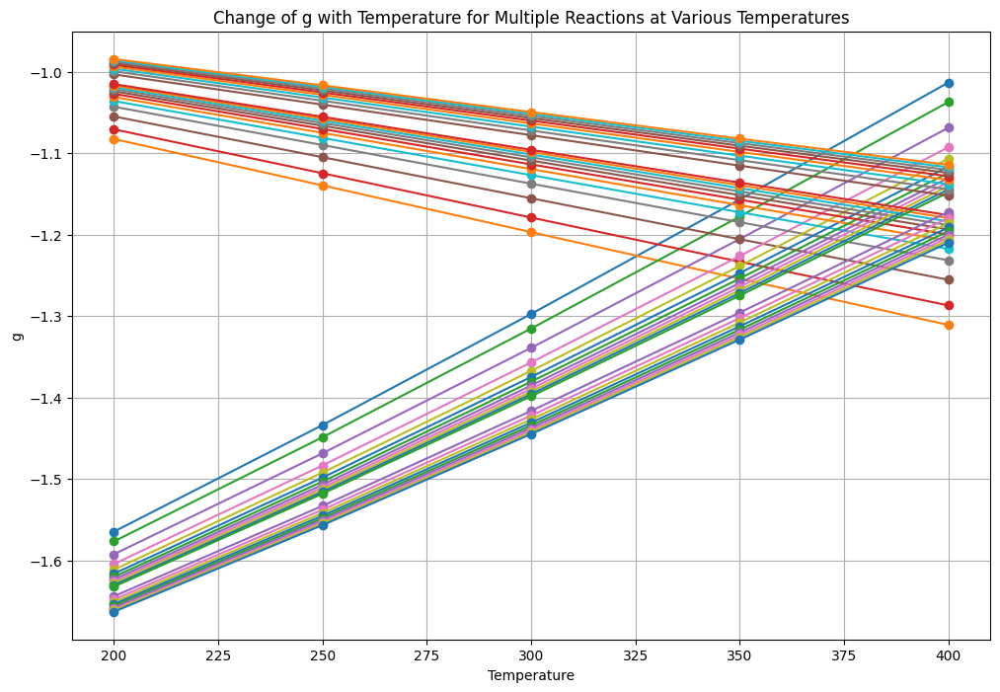

In [13]:
# Specify the temperatures you want to plot
reaction_ids = [10, 11]  # Change these to your desired Reaction IDs

# Create a line plot for each temperature
plt.figure(figsize=(12, 8))

# Loop through each temperature
for pressure in pressure_list:
    # Loop through each reaction ID
    for reaction_id in reaction_ids:
        # Filter the DataFrame for the current reaction ID and temperature
        filtered_data = df_results[(df_results['Reaction_id'] == reaction_id) & (df_results['Pressure'] == pressure)]
        
        # Plotting g vs Pressure for the current reaction ID and temperature
        plt.plot(filtered_data['Temperature'], filtered_data['g'], marker='o', linestyle='-', label=f'Reaction ID: {reaction_id}, Pressure: {pressure}')

# Labels and title
plt.xlabel('Temperature')
plt.ylabel('g')
plt.title('Change of g with Temperature for Multiple Reactions at Various Temperatures')
#plt.legend(title='Reactions and Pressures')
plt.grid()
plt.show()